In [1]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import io
import cv2

In [2]:
class ImageSeg:
    def __init__(self, path, threshold):
        self.path= path
        self.img= plt.imread(path)

        if self.img.max() <= 1:
            self.img= (self.img *255).astype(np.uint8)

        self.threshold=  threshold

    def visualize_rgb(self):
        rgb_img= self.img
        plt.imshow(rgb_img)
        plt.title("Raw RGB Image")
        plt.show()

    def RGNull(self):
        arr= np.array(self.img)
        for i in range(len(arr)):
            for j in range(len(arr[i])):
                arr[i][j][0]= 0
                arr[i][j][2]= 0
        return arr

    def IsoGray(self):
        RGNull_img= self.RGNull()
        gray_img= cv2.cvtColor(RGNull_img, cv2.COLOR_RGB2GRAY)
        return gray_img

    def IsoGrayThresh(self):
        gray_img= self.IsoGray()
        _, thresh_img = cv2.threshold(gray_img, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

        plt.imshow(thresh_img, cmap='gray')
        plt.title("Thresholded Image (Otsu's Method)")
        plt.show()
        return thresh_img

    def visualize_compare(self):
        fig = plt.figure(figsize=(14, 30))
        rows = 1
        cols = 3

        # Subplot 1: Raw RGB Image
        fig.add_subplot(rows, cols, 1)
        plt.imshow(self.img)
        plt.title("Raw RGB Image")

        # Subplot 2: Grayscale Image
        fig.add_subplot(rows, cols, 2)
        gray_img = self.IsoGray()
        plt.imshow(gray_img, cmap='gray')
        plt.title("Grayscale Image")

        # Subplot 3: Thresholded Image
        fig.add_subplot(rows, cols, 3)
        thresh_img = self.IsoGrayThresh()
        plt.imshow(thresh_img, cmap='gray')
        plt.title("Thresholded Image")

        plt.show()

    def PixelCount(self):
        count = 0
        arr = self.IsoGrayThresh()

        # Count non-zero pixels (i.e., white pixels) in the thresholded image
        for i in arr:
            for j in i:
                if j != 0:
                    count += 1
        return count

    def visualize_histogram(self):
        gray_img = self.IsoGray()
        plt.hist(gray_img.ravel(), bins=256, range=[0, 256])
        plt.title("Intensity Histogram")
        plt.xlabel("Pixel Intensity")
        plt.ylabel("Frequency")
        plt.show()
                 

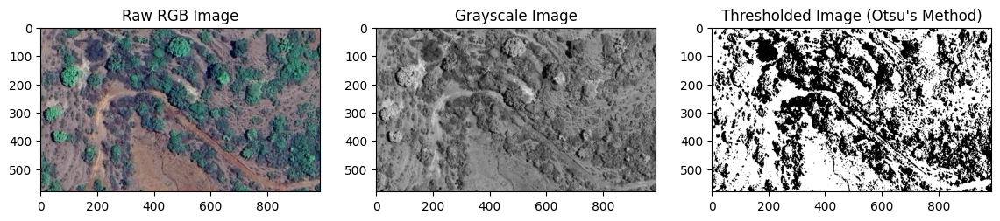

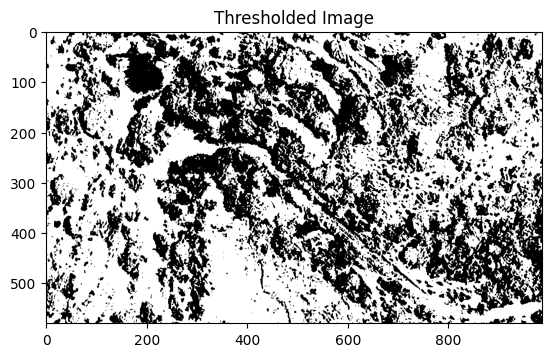

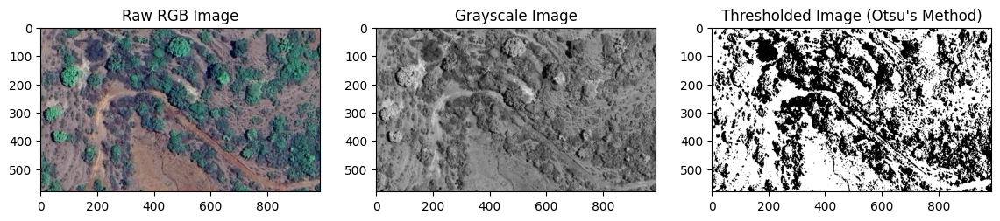

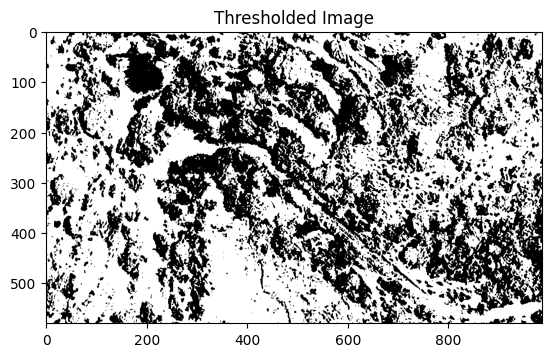

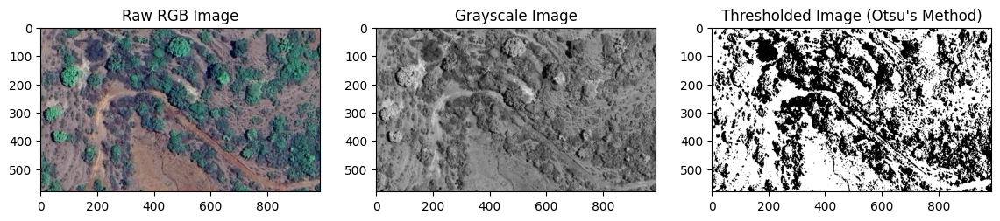

...

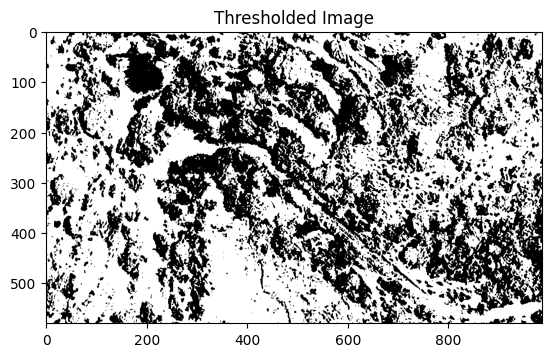

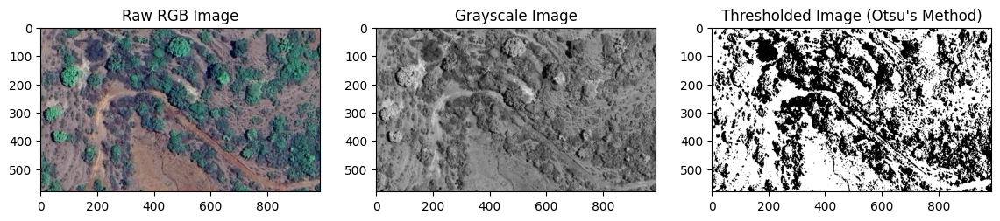

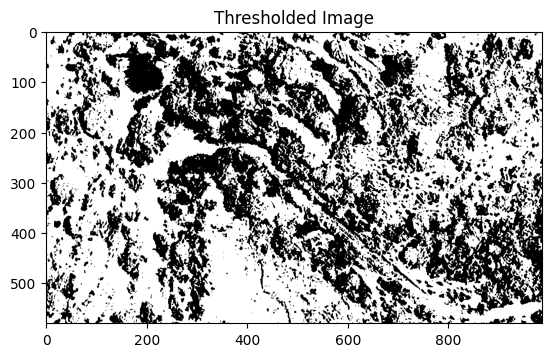

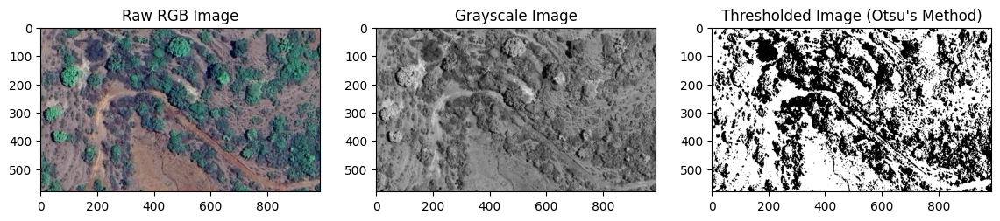

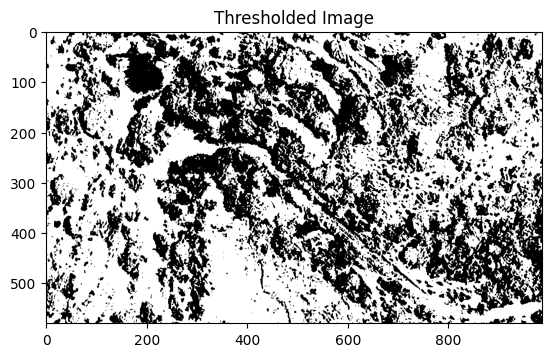

In [4]:
thresh = 0 
while thresh<100:
    thresh+=5
    obj = ImageSeg(r"C:\Users\Tanmay Patil\Desktop\tree1.png",thresh)
    obj.visualize_compare()